---
<table border="0">
 <tr>
    <td><font size="2">Authors: <b>Rushaliben More, Harmeet Singh & Siraz Uz Zaman</b></font></td> 
    <td><font size="2">Date: <b>09 December 2023</b></font></td>
    <td><font size="2">Project: <b>ML algorithms on Dry Beans data</b></font></td>
 </tr>
</table>

---


  <body>
    <div style="positon: relative; width: 100%">
      <img width = "100%" src="https://media.istockphoto.com/id/1289933177/photo/large-variety-of-dried-beans-and-legumes-shot-from-above.jpg?s=612x612&w=0&k=20&c=w-2tzyzOv6Wvyscv3qVfua7SAsjy_u5xawqPPnMawnI=" alt="Beans Wallpaper">
      <div style=" display: block;   bottom: 40px; ; background-color: rgba(0, 0, 0, 0.05); padding: 10px; font-size: 28px; z-index: 99"><center><b style="color: #175676;"><u style="color: #D62839;">Heart Failures Deciphered:</u> Mapping Insights through Clusters</b></center>
      </div>
    </div>
  </body>


<h3><b><u>Introduction</u></b></h3>

According to the Food and Agriculture Organizations (FAO), beans are a staple food for more tha 400 million people around the world. Not only are the consumption numbers staggering but the impact that bean cultivation has on global agriculture is also significant. It is noted that in the US alone, more than 1.5m acres of land is devoted to bean cultivation which leads to a production of 2.2b pounds of beans every year. Given the scale of the bean cultivation market and consumption, there is a potential to tap into this market for technologically advanced farming equipment manufacturers. 

In today's times, large scale farming has adopted technology, starting from automated irrigation systems to drone harvesting techniques. Imagine a world where robots could identify a bean plant and nurture the bean's journey from correct nutrition at growing stage to automated sorting and packaging in large bean factories. This is what is at the heart of Beanalytics LLC, a silicon valley tech company founded to drive agricultural innovation beyond the unimaginable.

<h3><b><u>Objective of Research</u></b></h3>

Beanalytics aims to revolutionize bean farming by implementing advanced technologies, specifically through the application of unsupervised clustering. The primary goal is to categorize and understand the inherent patterns within the diversity of bean varieties. By employing machine learning algorithms, we seek to identify natural groupings and relationships among beans based on features such as area, perimeter, and shape.

This journey hopes to extend beyond mere bean classification; it aspires to enhance the efficiency and precision of large-scale bean cultivation. Through machine learning algorithms (K-means clustering for a start), Beanalytics aims to contribute to the development of technologically advanced farming equipment that can discern, nurture, and process beans with unprecedented accuracy. The research further seeks to validate the practicality of this technology, paving the way for a future where automation seamlessly integrates with the intricate world of bean cultivation, ensuring optimal yields and sustainable agricultural practices. 

We, at Beanalytics want to prove to the world (using beans) the limitless potential of agricultural advancement and technology.


<h3><b><u>Data Exploration</u></b></h3>

For the purpose of this report, reliance is made on this <a href="https://www.kaggle.com/datasets/sansuthi/dry-bean-dataset/data">Kaggle Dataset</a>. The dataset is obtained from a computer vision system that took high resolution pictures of 13,911 grains of beans. The grain images were processed to 16 data features which can be potentially used to classify the beans to the respective bean types.

<h4><u>a. Preparing the Analytic Environment </u></h4>


In [1]:
# Importing the Necessary Modules
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio
import os
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
pio.renderers.default='notebook'
np.set_printoptions(suppress=True)
pd.options.mode.chained_assignment = None

import warnings

# Suppress the specific FutureWarning and UserWarning
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# Loading the beans data
beans_data = pd.read_csv('Data/Dry_Bean.csv')

<h4><u>b. Understanding the Data</u></h4>

In [2]:
# Dimensions of the beans data
print(f"The dry beans data has {beans_data.shape[1]} columns.")
print(f"The dry beans data has {beans_data.shape[0]} rows.")

The dry beans data has 17 columns.
The dry beans data has 13611 rows.


The above confirms that there are 17 data feature columns with image information extracted from 13,611 bean grains.

In [3]:
# Viewing the data feature list, evidence of missing values and data types
print(f"The dry beans data has the following columns: ")
beans_data.info()

The dry beans data has the following columns: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class      

From the above, the following insights of the data can be made:

- <b>Data Features: </b>The data consists of various information of the bean grains such as bean area, perimter, axis lengths, aspect ratio, eccentricity, convexity, roundness among other features. These features could prove to be good informants of classifying a particular grain to a specific bean type.
- <b>Data Completeness: </b> There are no missing values in the dataset as confirmed by the 'Non-Null Count' column. This therefore means that for this research, the need for cleaning the data for incomplete records or missing values is eliminated.
- <b>Data Types: </b>It is noted that majority of the data is numerical with the exception of the 'Class' feature which has the bean category.

We can further enhance our understanding of the data by viewing the data:

In [4]:
# Previewing the data
print(f"A preview of the first 5 records of the beans data is as follows:")
beans_data.head(5)

A preview of the first 5 records of the beans data is as follows:


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


<u><b>Obeservation:</b></u>
It can be confirmed from the visual print of the data that most features are numerical continous, with the exception of Area and Convex Area features. The first 5 records of grains relate to the beans category of SEKER.

Now that we have viewed the data, some key summary statistics can be pulled:

In [5]:
# Extract Summary Statistics of the beans Data (numerical features only)
print(f"Summary Statistics of the beans Data:")
beans_data.describe()

Summary Statistics of the beans Data:


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


From the above summary statistics, we can infer some of the following:
- The Area feature has a range of value from 20,420 to 254,616 pixels, suggesting significant variation in the size of the different beans. Similar interpretation can be made of the perimeter feature as it is also quite varied.
- The average aspect ratio of the beans is 1.58 which suggests that the beans are not very elongated. Although the minimum and maximum values are 1.02 and 2.43 respectively, which suggests that there are beans that are almost circular and those that have lengths twice the size of their width (and thus more elongated).
- The average roundness of the beans is approximately 0.87 which means that the beans in the dataset are not perfectly circular but close to a circular shape.

These insights suggest that their is sufficient information in the dataset to identify the characterists of various bean varieties. The dataset encompasses a wide range of bean sizes, shapes, and compactness, setting the stage for further exploration and clustering analysis. K-means clustering can leverage these features to categorize beans based on their inherent attributes, providing a deeper understanding of the distinct varieties within the dataset.

<h4><u>c. Confirming the Various Bean Classes</u></h4>

In [6]:
# Extract the unique bean classes and their counts in the beans data
# Extract unique values from the 'Class' column
unique_values = beans_data['Class'].unique()

# Calculate the count of occurrences for each unique value
unique_counts = beans_data['Class'].value_counts()

# Print the unique values and the count of occurrences
print("Bean Classes and Count of Occurences:","\n")
unique_counts

Bean Classes and Count of Occurences: 



DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

It is confirmed that there are seven different types of bean classes in the data with the DERMASON class having the highest number of observations at 3,546 records and the BOMBAY beans having the lowest count at 522 records. This does suggest that the classification data we are using is not uniformly distributed across classes but given the large number of records, it is expected that the clustering models would be able to distinguish between the various bean classes.

<b>Note:</b> At this stage, we note that we do not need to clean the data further as there are no missing values and the data types for the data features are appropriate.

<h3><b><u>Data Visualization</u></b></h3>

In this section, we will be visualizing some of the data features by means of visualisation techniques in python. The plots we have explored are:

<ol>a. Boxplots of Beans Data by Class</ol>
<ol>b. Percentage Distribution of classes (bean types)</ol>
<ol>c. Relationship of Area with Aspect Ratio</ol>
<ol>d. Relationship of ShapeFactor1 with ShapeFactor2</ol> 
<ol>e. Relationship of Roundness with Extent</ol>

<h4><b>a. Boxplots of Beans Data by Class</b></h4>

In [7]:
# Select numerical features
numerical_features = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
                       'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness',
                       'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']

# Scale all feature values
scaler = StandardScaler()
beans_standardized = scaler.fit_transform(beans_data[numerical_features])
beans_standardized_df = pd.DataFrame(beans_standardized, columns=numerical_features)
beans_standardized_df['Class'] = beans_data['Class']
beans_melted = pd.melt(beans_standardized_df, id_vars='Class', var_name='Feature', value_name='Value')

# Plotting the boxplot
fig_boxplot_all = px.box(beans_melted, x='Feature', y='Value', color='Class',
                         title='Boxplot of Numerical Features Facet with Class')
fig_boxplot_all.update_layout(width=1200, height=600)
fig_boxplot_all.show()

From the graph, we note that there may be some extreme (outlier) values for the Solidity and ShapeFactor4 features (specifically for the SEKER class). However, the occurence of this is too low and we have considered to not remove any outliers at this stage.

Another insight that can be derived from the above boxplots of the area, perimeter and other size related metrics, the Bombay beans are likely to be the biggest in size when compared to the other classes.

<h4><b>Percentage Distribution of classes (bean types)</b></h4>

In [8]:
# count of class occurences
class_counts = beans_data['Class'].value_counts().reset_index()
class_counts.columns = ['Class', 'Count']

# converting to percentage
class_counts['Percentage'] = (class_counts['Count'] / class_counts['Count'].sum()) * 100

# Plotting a pie chart to show distribution
fig = px.pie(class_counts, names='Class', values='Percentage', title='Percentage Distribution of Bean Classes', height=800, width=800)
fig.update_layout(
    margin=dict(l=40, r=40, t=40, b=40),
    paper_bgcolor="white",
)

fig.show()

From the plot above, we note that beans with the highest count in the data are the DERMASON beans, followed by the SIRA, SEKER and HOROZ. The BOMBAY beans occur the least in the data with only about 500 records our of the total 13k records.

<h4><b>c. Relationship of Area with Aspect Ratio</b></h4>

In [9]:
# Plot of Area vs Aspect Ratio (Facet with Class)
fig_scatter_area_aspect = px.scatter(beans_data, x='Area', y='AspectRation', color='Class',
                                     title='Scatter Plot of Area and Aspect Ratio Facet with Class')
fig_scatter_area_aspect.update_layout(width=800, height=800)
fig_scatter_area_aspect.show()

From the above plot of Area against Aspect Ratio, we do note that the Bombay beans can be distinguished easily from the plot. The other classes are well packed in one region of the plot and that suggests that just relying on these two features may not give the best clusters using k- means analysis.

<h4><b>d. Relationship of ShapeFactor1 with ShapeFactor2</b></h4>

In [10]:
# Plot of ShapeFactor1 vs ShapeFactor (Facet with Class)
fig_scatter_shapefactor1_shapefactor2 = px.scatter(beans_data, x='ShapeFactor1', y='ShapeFactor2', color='Class',
                                                   title='Scatter Plot of ShapeFactor1 and ShapeFactor2 Facet with Class')
fig_scatter_shapefactor1_shapefactor2.update_layout(width=800, height=800)
fig_scatter_shapefactor1_shapefactor2.show()

In the plot above, we view the same clusters (labels) using the ShapeFactor features of the data. These seem to portray much more clearly distinct clusters than the one in the previous factors. However, there are still regions that with overlap and thus just using two features may not be the best way to cluster data via unsupervised clustering.

<h4><b>e. Relationship of Roundness and Extent</b></h4>

In [11]:
# Plot of Roundness vs ShapeFactor (Facet with Class)
fig_scatter_roundness_extent = px.scatter(beans_data, x='roundness', y='Extent', color='Class',
                                          title='Scatter Plot of Roundness and Extent Facet with Class')
fig_scatter_roundness_extent.update_layout(width=800, height=800)
fig_scatter_roundness_extent.show()

From the above, we note that the clusters (labels) overlap much more than in the previous cases. This is intuitive as the beans are likely to have a similar roundness (which is also supported by the lower range between the minimum and maximum values in the summary statistics for the roundness feature). Again using just relying on roundness wouldn't give the best clusters.

<h3><b><u>Feature Selection</u></b></h3>

We have noted from the plots in the previous sections that there are no standalone group of data features that could best explain/portray the labels (clusters) in a clear and distinct manner. To investigate further, we assess whether there are any redundant features that could be excluded before fitting the k-means clustering.

<h4><u>a. Overview of the Relationship between Data Features</u></h4>

In this section, we will explore the various inter relationships between the bean features to identify at a high level the features that may be highly correlated and prove to be redundant.

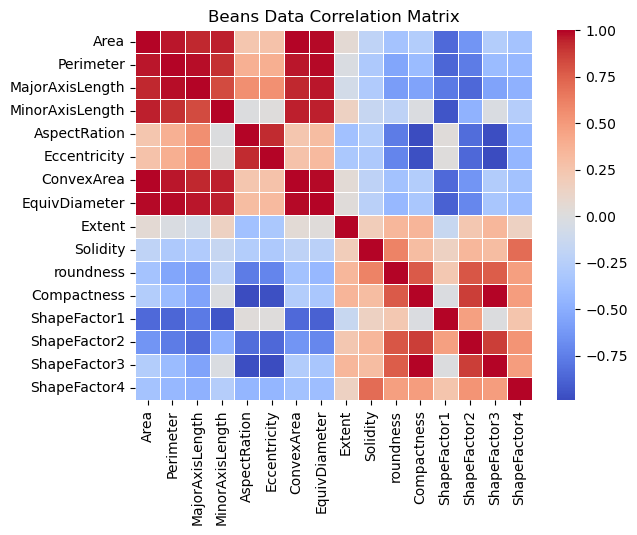

In [12]:
# Create a correlation matrix for the beans data
corr_matrix = beans_data.corr()

# Plotting the correlation matrix for the data features
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Beans Data Correlation Matrix')
plt.show()

From the correlation matrix plot, it can be observed that:
- There is high correlation between the dimensional features of the beans (Area, perimeter, Axis lengths, convex Area and EquivDiameter). It is expected for the lengths of the bean axis to be highly correlated to Area and Parameter as these feature are basically products of the lengths.
- The Convex Area and Equiv Diameter are also highly correlated with each other and thus one of the features may prove to be sufficient for the beans clustering.
- Despite the high correlation between the different features, the individual features are considered relevant. For instance, Area and the major and minor axis length are highly correlated but beans have different lengths and width despite the same area. Therefore, keeping the Area feature and removing the other features will lead to loss of key information.

<h4><u>b. Dimensionality Reduction using Principal Component Analysis</u></h4>

Based on the above observations, there is a evidence of redundant features (highly inter correlated) but these features are important for the accurate classification of the beans data. We will use PCA for reducing our data dimensions because:
1. We want to retain the imprortant information that our original data has as all attributes play a significant role in classification of beans
2. The features are highly correlated with each other and thus PCA will be effective in reducing this multicollinearity among the features.
3. PCA will capture most significant variability by reducing the impact of noise in the data due to using multiple features.
4. Preprocessing the data this way will help improve model efficiency of the various machine learning algorithms that we want to implement. Remember our objective is not to identify key features but to create a model that can improve beans classification into a real world business situation. Thus, model performance is more critical than interpretability at this stage.

In [13]:
# Standardizing the data
beans_scaled = StandardScaler().fit_transform(beans_data.drop(['Class'], axis=1))

# Apply PCA
pca = PCA(n_components=4)  # iterating the number of components to achieve 95% explained variation
beans_pca = pca.fit_transform(beans_scaled)

# Proportion of variance explained by each principal component
explained_variance_ratio = pca.explained_variance_ratio_

# Cumulative variance explained
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Print the results
for i in range(len(explained_variance_ratio)):
    print(f"Principal Component {i+1}: Explained Variance = {explained_variance_ratio[i]:.4f}, Cumulative Variance = {cumulative_variance_ratio[i]:.4f}")

Principal Component 1: Explained Variance = 0.5547, Cumulative Variance = 0.5547
Principal Component 2: Explained Variance = 0.2643, Cumulative Variance = 0.8190
Principal Component 3: Explained Variance = 0.0801, Cumulative Variance = 0.8990
Principal Component 4: Explained Variance = 0.0511, Cumulative Variance = 0.9502


We have settled with 4 number of principal components as this meets our desired threshold of 95% of explained variance ratio.

<h4><u>c. Pair Plot of Transformed Data (post-PCA)</u></h4>

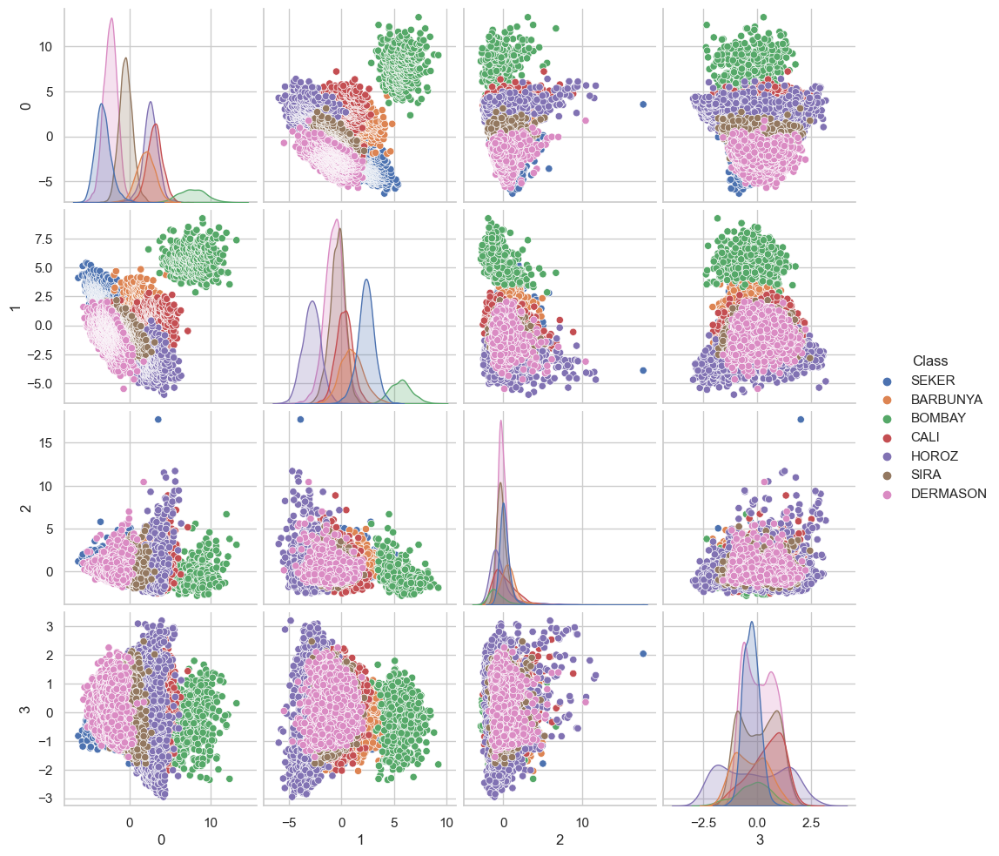

In [14]:
# Set ggplot style
sns.set(style='whitegrid')

# Add Class column to PCA data
final_beans_data_pca = pd.concat([pd.DataFrame(beans_pca), pd.DataFrame(beans_data['Class'])], axis=1)

# Create a pair plot with different colors for each class
sns.pairplot(final_beans_data_pca, hue='Class')

# Show the plot
plt.show()


In the above pair plot of the principal components, we are able to visualize the various clusters based on the two dimensional plots of the principal components. The plot of PC1 and PC2 looks similar to the Area and Aspect Ratio plot but with much more distinct clusters. 

**It is important to note at this stage that despite an ideal classification problem should have distinct (non-overlapping clusters when plotted), a real world situation will always be more complex and the objective is to progressively tune and modify models inorder to reach the desired success metrics.

<h3><b><u>Unsupervised Learning: K-Means Clustering</u></b></h3>

In this section, we will be fitting the k-means clustering algorithm to our transformed data (principal components) to determine the appropriate level of clusters. We will be using the WCSS (total within-cluster sum of squares) to determine the optimum number of clusters.

In [15]:
# Run k means interation from n=1 to n=15 clusters and plot WCSS curve
wcss = []
for i in range(1, 15):
    kmeans = KMeans(n_clusters = i, init = "k-means++", max_iter = 500, n_init = 10, random_state = 123)
    kmeans.fit(pd.DataFrame(beans_pca))
    wcss.append(kmeans.inertia_)
    
fig = go.Figure(data = go.Scatter(x = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15], y = wcss))

# Plot WCSS
fig.update_layout(title='WCSS vs. Cluster number',
                   xaxis_title='Clusters',
                   yaxis_title='WCSS',
                   height=800,
                   width=800)

fig.update_layout(
margin=dict(l=40, r=40, t=40, b=40),
paper_bgcolor="White")
fig.show()

From the WCSS curve above, we choose the number of clusters = 7, because beyond 7 clusters, the curve flattens with minimal changes in the WCSS for every increase in cluster. This is equal to the bean varieties in the original data (7 bean classes). We now proceed to fit our k-means to 7 number of clusters and review the clusters in more detail.

In [16]:
# Fitting k means clusters to n-7
kmeans = KMeans(n_clusters = 7, init="k-means++", max_iter = 500, n_init = 10, random_state = 123)
identified_clusters = kmeans.fit_predict(pd.DataFrame(beans_pca))


data_with_clusters = final_beans_data_pca.copy()
data_with_clusters['Cluster'] = identified_clusters

We now plot the k-means clustering output via a scatter plot of PC1 vs PC2

In [17]:
# Plot of PC1 vs PC2 with k-means clusters
fig = px.scatter(data_with_clusters, x = 0, y=1,
              color='Cluster',size='Cluster', opacity = 1, size_max=20, height=800, width=1000)
fig.update_traces(mode='markers', marker_line_width=0.20, marker_size=10)
fig.show()

And now we can compare this with the original labelled data visually using PC1 and PC2 too:

In [18]:
# Plot of PC1 vs PC2 with labelled classes
fig = px.scatter(data_with_clusters, x = 0, y=1,
              color='Class', opacity = 1, size='Cluster', size_max=20, height=800, width=1000, symbol='Class')
fig.update_traces(mode='markers', marker_line_width=0.20, marker_size=10)
fig.show()

From the above plots, we see that for most of the clusters, the k-means clusters and the labelled data appear very similar, except for the region Dermason and Sira bean classes. These are the categories that had the highest level of overlap initially and thus the clusters appear significantly different for these classes.

We can access the accuracy of the k-means clusters vs the original labels by matching the original labels with the k-means clusters indexes.

In [19]:
# Step 1: Group Data by True Labels
grouped_data = data_with_clusters.groupby('Class')


# Step 2: Check Assigned Clusters and Step 3: Calculate Accuracy
class_accuracies = {}

for label, group in grouped_data:
    unique_clusters = group['Cluster'].unique()
    counts = []
    for cluster_number in unique_clusters:
        cluster_count = len(group[group['Cluster']==cluster_number])
        counts.append(cluster_count)
    counts = sorted(counts,reverse=True)
    print(f"The accuracy of {label} beans in our cluster analysis is {round(counts[0]/sum(counts)*100,2)}%")


The accuracy of BARBUNYA beans in our cluster analysis is 82.07%
The accuracy of BOMBAY beans in our cluster analysis is 99.62%
The accuracy of CALI beans in our cluster analysis is 83.01%
The accuracy of DERMASON beans in our cluster analysis is 83.08%
The accuracy of HOROZ beans in our cluster analysis is 85.89%
The accuracy of SEKER beans in our cluster analysis is 92.11%
The accuracy of SIRA beans in our cluster analysis is 85.77%


From the above, we see that the iverall accuracy lies around the 85-90% mark. The Bombay class have the higehst accuracy at 99.62%, this was expected given the visuals in the previous sections. The least accuracy is in the Dermason, Barbunya and Sira classes (as was expected).

<h3><b><u>Conclusion</u></b></h3>

From our analysis and adoption of machine learning technique, we have observed that:

1. Feature selection using PCA helps reduce data dimensionality and model complexity when data is highly correlated but important
2. K-Means clustering and WCSS indicated that optimum number of clusters is 7 (similar to labelled data)
3. Clusters with distinct attributes (eg Bombay) would result in higher accuracy in clustering than clusters/beans that have similar attributes
4. There is scope for improving the classification process using train and test models and adopting more complex classification algorithms such as random forests and XGboost.

The journey of a bean will continue!


---

--- End of Project ---

---
